https://data.mendeley.com/datasets/992mh7dk9y/2

https://github.com/AjNavneet/Insurance-Price-Forecast-XGBoost-Regression/blob/master/lib/insurance_pricing_forecast.ipynb

https://aab11e6.github.io/Insurance-claims/data.html?utm_source=chatgpt.com

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
import missingno as msno
import plotly.express as px
import plotly.io as pio
import os
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
from scipy.stats import chi2_contingency

df = pd.read_csv(r"D:\Project\Insurance\Data\insurance_claims.csv")
df.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,2014-10-17,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,2006-06-27,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,2000-09-06,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,1990-05-25,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,2014-06-06,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN


In [ ]:
df.info()
df.shape

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

(1000, 40)

In [ ]:
print(f"Df dim:{df.shape}")

#this df uses "?" for missing values instead of NaN 
df=df.replace("?",np.nan)

nan_count = df.isna().sum().sort_values(ascending=False)
print(nan_count)

Df dim:(1000, 40)
_c39                           1000
property_damage                 360
police_report_available         343
collision_type                  178
authorities_contacted            91
bodily_injuries                   0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
fraud_reported                    0
auto_year                         0
auto_model                        0
total_claim_amount                0
injury_claim                      0
property_claim                    0
vehicle_claim                     0
auto_make                         0
witnesses                         0
months_as_customer                0
age                               0
insured_zip                       0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_ded

There are 0 duplicates in the dataset.


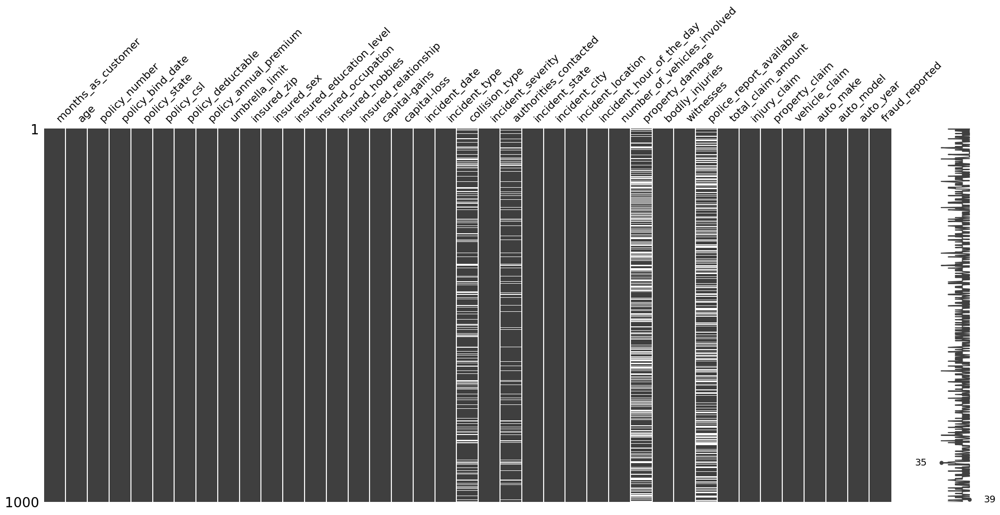

In [ ]:
df.drop("_c39", axis=1, inplace=True)
df.columns

#visualizing missing values 
msno.matrix(df)

#checking for duplicates
dupe_count=df["policy_number"].duplicated().sum()
print(f"There are {dupe_count} duplicates in the dataset.")

EDA

In [ ]:
#checking to see if there are enough fraud instances to train on
print(df["fraud_reported"].value_counts())
numerical_cols = df.select_dtypes(include=["int64","float64"]).columns.tolist()
catagorical_cols = df.select_dtypes(include=["object"]).columns.tolist()
df.describe()

fraud_reported
N    753
Y    247
Name: count, dtype: int64


,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000
mean,203.954000,38.948000,546238.648000,1136.000000,1256.406150,1.101000e+06,501214.488000,25126.100000,-26793.700000,11.644000,1.83900,0.992000,1.487000,52761.94000,7433.420000,7399.570000,37928.950000,2005.103000
std,115.113174,9.140287,257063.005276,611.864673,244.167395,2.297407e+06,71701.610941,27872.187708,28104.096686,6.951373,1.01888,0.820127,1.111335,26401.53319,4880.951853,4824.726179,18886.252893,6.015861
min,0.000000,19.000000,100804.000000,500.000000,433.330000,-1.000000e+06,430104.000000,0.000000,-111100.000000,0.000000,1.00000,0.000000,0.000000,100.00000,0.000000,0.000000,70.000000,1995.000000
25%,115.750000,32.000000,335980.250000,500.000000,1089.607500,0.000000e+00,448404.500000,0.000000,-51500.000000,6.000000,1.00000,0.000000,1.000000,41812.50000,4295.000000,4445.000000,30292.500000,2000.000000
50%,199.500000,38.000000,533135.000000,1000.000000,1257.200000,0.000000e+00,466445.500000,0.000000,-23250.000000,12.000000,1.00000,1.000000,1.000000,58055.00000,6775.000000,6750.000000,42100.000000,2005.000000
75%,276.250000,44.000000,759099.750000,2000.000000,1415.695000,0.000000e+00,603251.000000,51025.000000,0.000000,17.000000,3.00000,2.000000,2.000000,70592.50000,11305.000000,10885.000000,50822.500000,2010.000000
max,479.000000,64.000000,999435.000000,2000.000000,2047.590000,1.000000e+07,620962.000000,100500.000000,0.000000,23.000000,4.00000,2.000000,3.000000,114920.00000,21450.000000,23670.000000,79560.000000,2015.000000


In [ ]:
df.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported'],
      dtype='object')

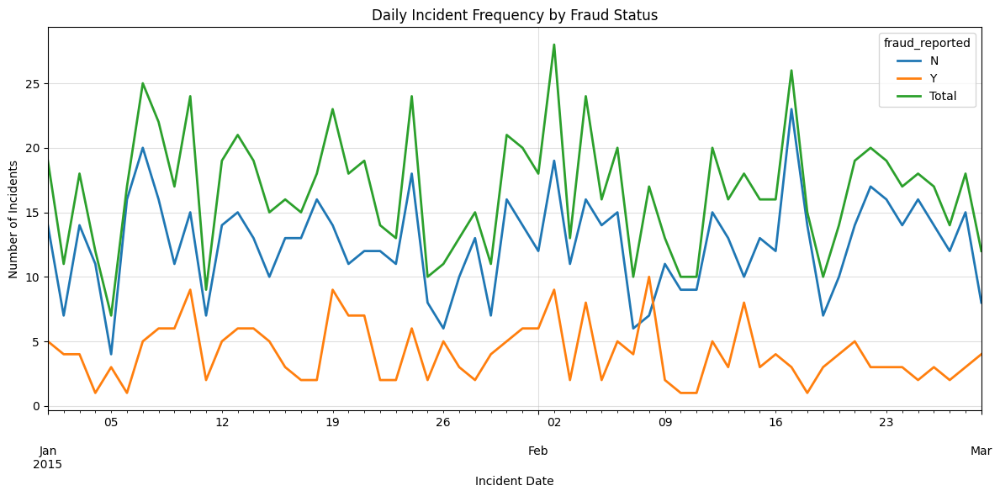

In [ ]:
#making a time series of incidents
#maybe remake in plotly
df["incident_date"] = pd.to_datetime(df["incident_date"])

# Get daily counts of Y/N
daily = (
    df.groupby(["incident_date", "fraud_reported"])
      .size()
      .reset_index(name="count")
      .pivot(index="incident_date", columns="fraud_reported", values="count")
)

# Add total column
daily["Total"] = daily.sum(axis=1)

# Plot all three lines
daily.plot(figsize=(12, 6), lw=2)
plt.title("Daily Incident Frequency by Fraud Status")
plt.xlabel("Incident Date")
plt.ylabel("Number of Incidents")
plt.grid(True, alpha=0.4)
plt.tight_layout()
plt.show()


In [ ]:
import plotly.express as px
#figure out how to make a county level choropleth map 
incident_state_counts = {
    'incident_state': ['NY', 'SC', 'WV', 'NC', 'VA', 'PA', 'OH'],
    'Incident_Frequency': [262, 248, 217, 110, 110, 30, 23]
}
state_counts_df = pd.DataFrame(incident_state_counts)

print("--- Aggregated Data ---")
print(state_counts_df)


fig = px.choropleth(
    state_counts_df, 
    locations='incident_state', 
    locationmode='USA-states',       
    color='Incident_Frequency',       
    scope='usa',                      
    color_continuous_scale="Viridis",
    title='Frequency of Incidents by State',
    hover_name='incident_state',      
    height=600                        
)


fig.update_layout(
    margin={"r":0,"t":50,"l":0,"b":0},
    geo=dict(
        bgcolor='rgba(0,0,0,0)',      
        lakecolor='rgb(255, 255, 255)' 
    )
)
fig.show()

--- Aggregated Data ---
  incident_state  Incident_Frequency
0             NY                 262
1             SC                 248
2             WV                 217
3             NC                 110
4             VA                 110
5             PA                  30
6             OH                  23


Bivariate Analysis
-divide into quantative and qualitative data

Quantitative:
-check for colinearity
-update corr plot to show hue of fraud_reported

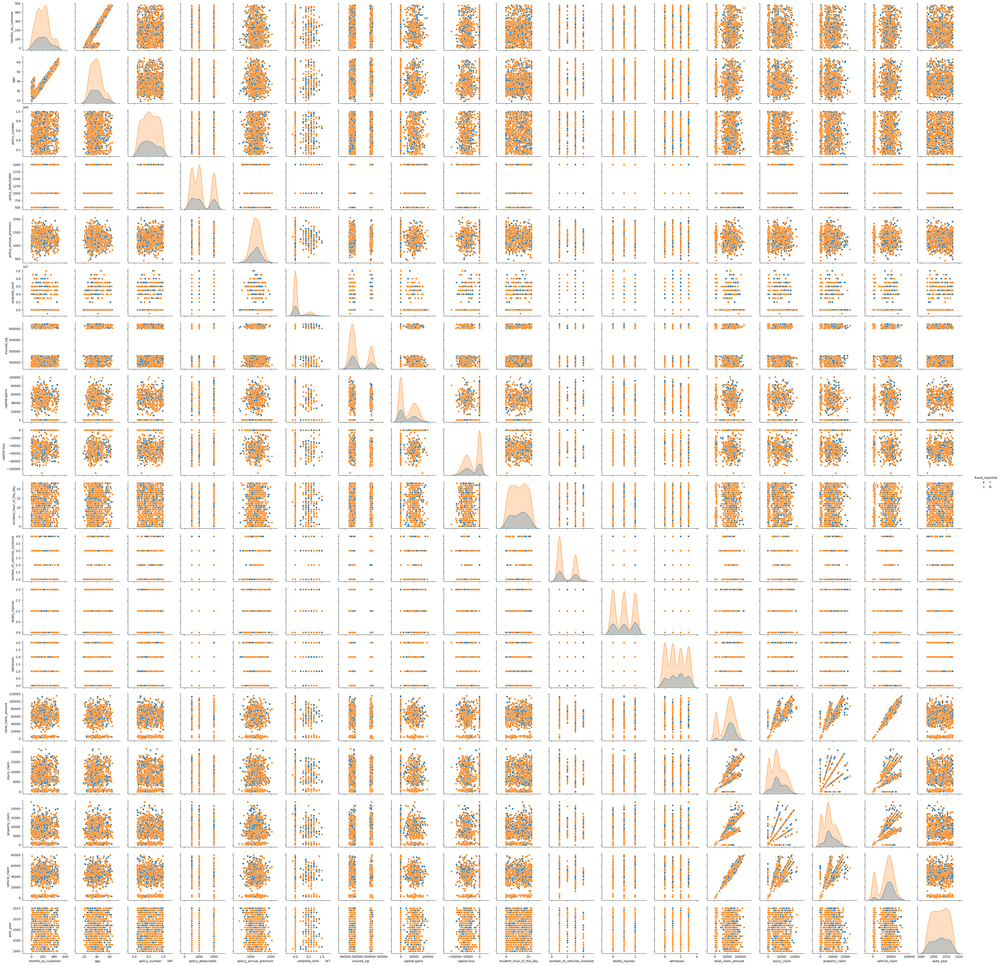

In [ ]:
#blue=fraud, orange=non_fraud
sns.pairplot(df,vars=numerical_cols,hue="fraud_reported")

In [ ]:
#making a function to automatically generate histograms for all numeric columns
#maybe make boxplots too
save_location=r"D:\Project\Insurance\Figures\Histograms"
def generate_hists(df, variable, save_location, fraud_col="fraud_reported"):
    os.makedirs(save_location, exist_ok=True)

    fraud_true = df[df[fraud_col] == "Y"][variable]
    fraud_false = df[df[fraud_col] == "N"][variable]

    
    n_true, n_false = len(fraud_true), len(fraud_false)


    bins = np.linspace(df[variable].min(), df[variable].max(), 50)

    # Compute normalized histograms
    hist_Y, _ = np.histogram(fraud_true, bins=bins)
    hist_N, _ = np.histogram(fraud_false, bins=bins)
    normalized_hist_Y = hist_Y / n_true
    normalized_hist_N = hist_N / n_false

    # Plot
    plt.figure(figsize=(10, 6))
    plt.bar(bins[:-1], normalized_hist_Y, width=np.diff(bins),
            alpha=0.6, label="Fraud Reported (Y)")
    plt.bar(bins[:-1], normalized_hist_N, width=np.diff(bins),
            alpha=0.6, label="Fraud Not Reported (N)")

    plt.title(f"Normalized Distribution of {variable}")
    plt.xlabel(variable)
    plt.ylabel("Normalized Frequency")
    plt.legend()
    plt.grid(True, alpha=0.3)

    # Save to file
    fig_path = os.path.join(save_location, f"{variable}_hist.png")
    plt.tight_layout()
    plt.savefig(fig_path, dpi=300)
    plt.close()
# Generate histograms for all numeric columns
for col in numerical_cols:
    generate_hists(df, col, save_location)



In [ ]:
from scipy.stats import shapiro
#testing for normality among numeric columns
for col in numerical_cols:
    stat, p = shapiro(df[col].dropna().sample(500) if len(df) > 500 else df[col].dropna())
    print(f"{col}: p = {p:.4f}")
#all but one appear to be normally distributed

months_as_customer: p = 0.0000
age: p = 0.0000
policy_number: p = 0.0000
policy_deductable: p = 0.0000
policy_annual_premium: p = 0.8584
umbrella_limit: p = 0.0000
insured_zip: p = 0.0000
capital-gains: p = 0.0000
capital-loss: p = 0.0000
incident_hour_of_the_day: p = 0.0000
number_of_vehicles_involved: p = 0.0000
bodily_injuries: p = 0.0000
witnesses: p = 0.0000
total_claim_amount: p = 0.0000
injury_claim: p = 0.0000
property_claim: p = 0.0000
vehicle_claim: p = 0.0000
auto_year: p = 0.0000


In [ ]:
#using variance inflation factor to check for multicollinearity
X = df[numerical_cols]

X = add_constant(X)

vif_data = pd.DataFrame()
vif_data["feature"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif_data = vif_data.sort_values("VIF", ascending=False)
print(vif_data)

#should remove total_claim_amount since it is a sum of other columns and might lead to 

                        feature           VIF
17                vehicle_claim           inf
16               property_claim           inf
15                 injury_claim           inf
14           total_claim_amount           inf
0                         const  1.132633e+05
2                           age  6.790447e+00
1            months_as_customer  6.773985e+00
11  number_of_vehicles_involved  1.099172e+00
10     incident_hour_of_the_day  1.068207e+00
13                    witnesses  1.023967e+00
4             policy_deductable  1.022263e+00
8                 capital-gains  1.016501e+00
9                  capital-loss  1.015597e+00
18                    auto_year  1.015469e+00
5         policy_annual_premium  1.012599e+00
7                   insured_zip  1.012211e+00
12              bodily_injuries  1.011926e+00
6                umbrella_limit  1.007713e+00
3                 policy_number  1.005807e+00


C:\Users\ethan\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\statsmodels\stats\outliers_influence.py:197: RuntimeWarning:

divide by zero encountered in scalar divide



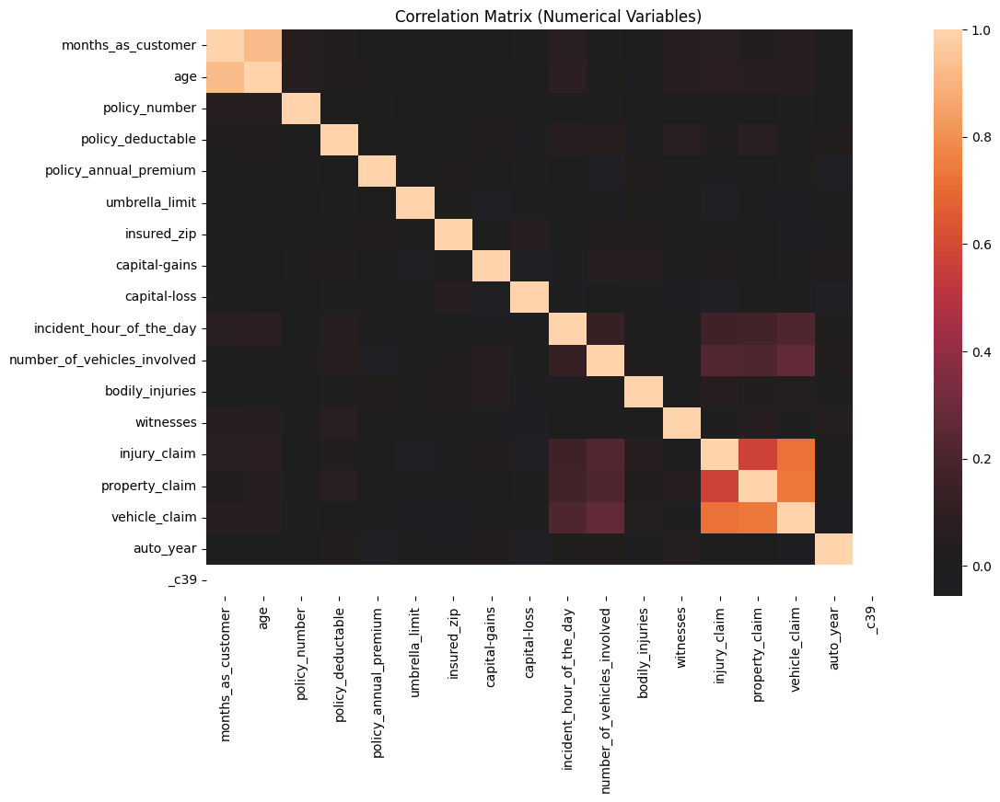

In [ ]:
#Dropping total_claim_amount to reduce 
df.drop("total_claim_amount",axis=1,inplace=True)
df.corr(method="pearson", numeric_only=True)
#drop total claim since it is a sum of other columns and we loose info from it
corr = df.corr(numeric_only=True)

plt.figure(figsize=(12, 8))
sns.heatmap(corr, center=0, annot=False)
plt.title("Correlation Matrix (Numerical Variables)")
plt.show()

Qualitative:
-chi squared for missing values
-see if hobbies is significant 

In [ ]:
df=df.replace(np.nan,"?")

#checking to see if missing values are significant
incomplete_cols = [
    "property_damage",
    "police_report_available",
    "collision_type",
    "authorities_contacted"
]
print(f"Chi-Squared Test for cols with missing values:")

for col in incomplete_cols:
    contingency_table = pd.crosstab(df[col], df["fraud_reported"])
    chi2, p, dof, expected = chi2_contingency(contingency_table)
    print(f"{col}:  p-value = {p}")
print("\nMissing values are significant so I will keep them.")



Chi-Squared Test for cols with missing values:
property_damage:  p-value = 0.018032963211621726
police_report_available:  p-value = 0.6565199966565936
collision_type:  p-value = 7.118897790511356e-07
authorities_contacted:  p-value = 2.7277014451435857e-05

Missing values are significant so I will keep them.


In [ ]:
#making chi squared tests for categorical variables to see if they should be implemented into the model
contingency_table = pd.crosstab(df['insured_hobbies'], df['fraud_reported'])

chi2, p_value, dof, expected = chi2_contingency(contingency_table)

print("\nChi-Squared Test Results (Insured Hobbies):")
print(f"Chi-Square Statistic: {chi2:.4f}")
print(f"Degrees of Freedom (dof): {dof}")
print(f"P-value: {p_value}")
expected_df = pd.DataFrame(expected, 
                           index=contingency_table.index, 
                           columns=contingency_table.columns)

contingency_table = pd.crosstab(df['insured_occupation'], df['fraud_reported'])

chi2, p_value, dof, expected = chi2_contingency(contingency_table)

print("\nChi-Squared Test Results (Insured Occupation):")
print(f"Chi-Square Statistic: {chi2:.4f}")
print(f"Degrees of Freedom (dof): {dof}")
print(f"P-value: {p_value}")
expected_df = pd.DataFrame(expected, 
                           index=contingency_table.index, 
                           columns=contingency_table.columns)

contingency_table = pd.crosstab(df['insured_education_level'], df['fraud_reported'])

chi2, p_value, dof, expected = chi2_contingency(contingency_table)

print("\nChi-Squared Test Results (Insured Education Lv):")
print(f"Chi-Square Statistic: {chi2:.4f}")
print(f"Degrees of Freedom (dof): {dof}")
print(f"P-value: {p_value}")
expected_df = pd.DataFrame(expected, 
                           index=contingency_table.index, 
                           columns=contingency_table.columns)



Chi-Squared Test Results (Insured Hobbies):
Chi-Square Statistic: 162.3154
Degrees of Freedom (dof): 19
P-value: 8.989147139882094e-25

Chi-Squared Test Results (Insured Occupation):
Chi-Square Statistic: 17.6593
Degrees of Freedom (dof): 13
P-value: 0.17088761164902544

Chi-Squared Test Results (Insured Education Lv):
Chi-Square Statistic: 1.6882
Degrees of Freedom (dof): 6
P-value: 0.9460265140372582


Making features:
car model
car age

Feature creation

In [ ]:
df["incident_date"]=pd.to_datetime(df["incident_date"])
df["policy_bind_date"]=pd.to_datetime(df["policy_bind_date"])

#how long a client has been covered before incident
df["time_covered"]=(df["incident_date"]-df["policy_bind_date"]).dt.days

#assuming capital-gains and capital-loss represent a persons recent financial activity
df["net_capital"]=df["capital-gains"]-df["capital-loss"]

#creating claim to premium ratio to measure how profitable filing a false claim would be
df["Total_claim_amount"]=df["injury_claim"]+df["property_claim"]+df["vehicle_claim"]
df["claim_premium_ratio"]=df["Total_claim_amount"]/df["policy_annual_premium"]


#creating a var to measure the skew in claim types, apparently it is uced as an indicator for fraud
df['max_claim_component'] = df[['injury_claim', 'property_claim', 'vehicle_claim']].max(axis=1)
df['max_claim_ratio'] = df['max_claim_component'] / df['Total_claim_amount'].replace(0, 1)
df.drop('Total_claim_amount', axis=1, inplace=True)


In [ ]:
df.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'injury_claim',
       'property_claim', 'vehicle_claim', 'auto_make', 'auto_model',
       'auto_year', 'fraud_reported', 'time_covered', 'net_capital',
       'claim_premium_ratio', 'max_claim_component', 'max_claim_ratio'],
      dtype='object')

Encoding

In [ ]:
training_df=df.copy()
#dropping unneeded features before splitting
training_df=training_df.drop(["policy_number","policy_bind_date","insured_education_level","insured_occupation"],axis=1)
#maybe delete the car model features after combining them into one variable


In [ ]:
from sklearn.model_selection import train_test_split

#defining lists of vars to efficently encode them later
nominal_cols = [
    'policy_state', 'insured_hobbies',
    'insured_relationship', 'incident_type', 'collision_type',
    'authorities_contacted', 'incident_state', 'incident_city',
    'auto_make', 'auto_model'
]
binary_cols = ['insured_sex', 'property_damage', 'police_report_available']
ordinal_cols = ['incident_severity']
numerical_cols = [
    'age', 'months_as_customer', 'policy_deductable',
    'policy_annual_premium', 'umbrella_limit', 'capital-gains',
    'capital-loss', 'incident_hour_of_the_day', 'number_of_vehicles_involved',
    'bodily_injuries', 'witnesses', 'injury_claim', 'property_claim',
    'vehicle_claim', 'auto_year',
    'max_claim_ratio','net_capital','claim_premium_ratio','time_covered'
]
#
binary_map = {'Y': 1, 'N': 0, '?': np.nan}

#defining train test splits
X = training_df.drop('fraud_reported', axis=1)
y = training_df['fraud_reported']
#preforming binary encoding on target variable
y = y.map(binary_map)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42, stratify=y
)

In [ ]:
#encoding ordinal/binary variables
severity_order = {'Total Loss': 4, 'Major Damage': 3, 'Minor Damage': 2, 'Trivial Damage': 1}
X_train['severity_encoded'] = X_train['incident_severity'].map(severity_order)
X_test['severity_encoded'] = X_test['incident_severity'].map(severity_order)
numerical_cols.append('severity_encoded')

for col in binary_cols:
    X_train[col] = X_train[col].map(binary_map)
    X_test[col] = X_test[col].map(binary_map)
numerical_cols.extend(binary_cols)

In [ ]:
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
import xgboost as xgb

preprocessor = ColumnTransformer(
    transformers=[
        ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False), nominal_cols),
        ('numeric', 'passthrough', numerical_cols)
    ],
    remainder='drop'
)

xgb_model = xgb.XGBClassifier(
    objective='binary:logistic',
    random_state=42,
    use_label_encoder=False,
    eval_metric='logloss'
)

pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('classifier', xgb_model)
])

In [ ]:
from sklearn.model_selection import GridSearchCV
param_grid = {
    'classifier__n_estimators': [100, 200],
    'classifier__max_depth': [3, 5, 7],
    'classifier__learning_rate': [0.05, 0.1, 0.2],
    'classifier__colsample_bytree': [0.7, 0.8, 1.0]
}

grid_search = GridSearchCV(
    pipeline,
    param_grid=param_grid,
    scoring='roc_auc',
    cv=3,
    n_jobs=-1,
    verbose=1
)

print("Running grid search...")
grid_search.fit(X_train, y_train)
print(f"Best Parameters: {grid_search.best_params_}")
print(f"Best CV ROC AUC: {grid_search.best_score_:.4f}")

best_model = grid_search.best_estimator_
print(f"Test Accuracy: {best_model.score(X_test, y_test):.4f}")


Running grid search...
Fitting 3 folds for each of 54 candidates, totalling 162 fits
Best Parameters: {'classifier__colsample_bytree': 1.0, 'classifier__learning_rate': 0.1, 'classifier__max_depth': 3, 'classifier__n_estimators': 100}
Best CV ROC AUC: 0.8797
Test Accuracy: 0.8067


C:\Users\ethan\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\xgboost\training.py:199: UserWarning:

[23:38:05] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:790: 
Parameters: { "use_label_encoder" } are not used.




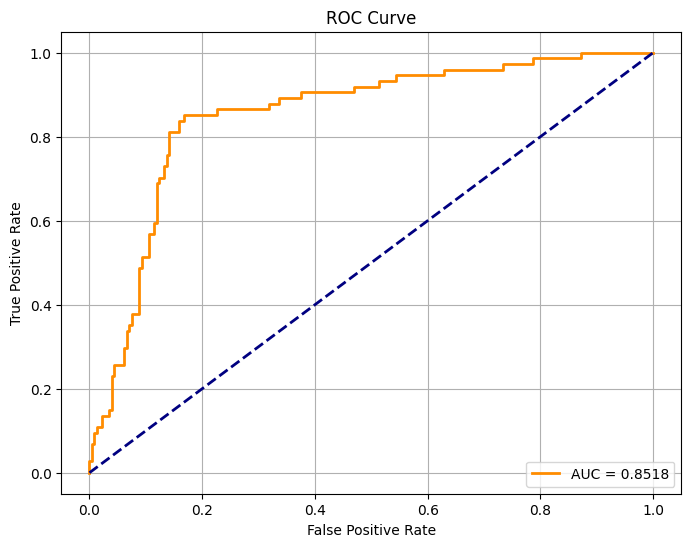

ROC AUC: 0.8518
              precision    recall  f1-score   support

    No Fraud       0.86      0.88      0.87       226
       Fraud       0.62      0.57      0.59        74

    accuracy                           0.81       300
   macro avg       0.74      0.73      0.73       300
weighted avg       0.80      0.81      0.80       300



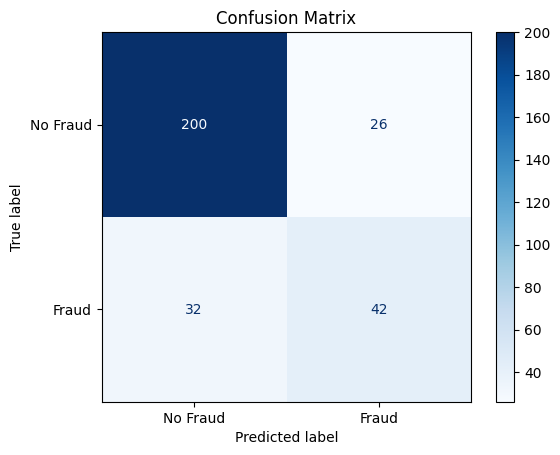

In [ ]:
from sklearn.metrics import (roc_curve, auc, classification_report,confusion_matrix, ConfusionMatrixDisplay)

def evaluate_classifier_performance(model, X_test, y_test):
    y_proba = model.predict_proba(X_test)[:, 1]
    y_pred = model.predict(X_test)

    fpr, tpr, _ = roc_curve(y_test, y_proba)
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'AUC = {roc_auc:.4f}')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc="lower right")
    plt.grid(True)
    plt.show()

    print(f"ROC AUC: {roc_auc:.4f}")
    print(classification_report(y_test, y_pred, target_names=['No Fraud', 'Fraud']))

    cm = confusion_matrix(y_test, y_pred)
    ConfusionMatrixDisplay(cm, display_labels=['No Fraud', 'Fraud']).plot(cmap='Blues')
    plt.title('Confusion Matrix')
    plt.show()

evaluate_classifier_performance(best_model, X_test, y_test)
#look into how to better split train and test data. F1 score is probably low due to class imbalance.